In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>''')

In [89]:
from IPython.display import Image
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as grd
import folium as fol
from sklearn import decomposition, preprocessing
from scipy import stats
from scipy.stats import shapiro, normaltest, anderson, mannwhitneyu
from branca.element import Figure
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
from scipy.stats import norm, gamma, expon, exponweib, weibull_max, genextreme, powerlaw
import scipy.stats as st
from scipy.stats import chi2
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

import time
%matplotlib inline

In [4]:
# Importing Listings And Reviews Data from JOJIE
def load_data(date):
    """Return AirBnb data sets as pandas.DataFrame.

    Accesses /mnt/data/public/insideairbnb/data.insideairbnb.com/japan/
    kantō/tokyo/ and loads listings and review data sets into
    pandas.Dataframe.

    Parameters
    ----------
    date : str
        Scraping date in yyy-mm-dd format

    Returns
    -------
    """

    listings_raw = pd.read_csv('/mnt/data/public/insideairbnb/'
                               'data.insideairbnb.com/japan/kantō/tokyo/'
                               f'{date}/data/listings.csv.gz',
                               compression='gzip',
                               low_memory=False,
                               parse_dates=['last_scraped', 'host_since'])

    return listings_raw

In [5]:
# Load Data from JOJIE
# lr = load_data('2021-07-20')

In [6]:
# Feature Selection, Data Cleaning, and Dummy Variable Creation
# fields = ['name',
#           'host_id',
#           'host_name',
#           'last_scraped',
#           'host_since',
#           'host_response_rate',
#           'host_is_superhost',
#           'host_listings_count',
#           'latitude',
#           'longitude',
#           'property_type',
#           'room_type',
#           'accommodates',
#           'bathrooms_text',
#           'bedrooms',
#           'beds',
#           'amenities',
#           'price',
#           'minimum_nights',
#           'maximum_nights',
#           'availability_365',
#           'number_of_reviews',
#           'review_scores_rating',
#           'review_scores_accuracy',
#           'review_scores_cleanliness',
#           'review_scores_checkin',
#           'review_scores_communication',
#           'review_scores_location',
#           'review_scores_value',
#           'reviews_per_month']

# Select fields and drop rows with missing values
# lr_select = lr[fields].dropna()

# Count the number of listed amenities
# lr_select['amenities_ct'] = lr_select['amenities'].str.strip('[]').\
# str.split(',').str.len()

# Calculate number of days as host
# lr_select['days_as_host'] = (lr_select.last_scraped -
#                              lr_select.host_since).dt.days

# Convert price to float
# lr_select['price'] = lr_select['price'].replace({'\$': '',
#                                                  ',': ''},
#                                                 regex=True).astype(float)

# Extract bathroom count from bathrooms_text
# def bathrooms(text):
#     """Extract number of bathrooms."""
#     try:
#         bath = float(text.split()[0])
#     except:
#         if 'half' in text.lower():
#             bath = 0.5
#         else:
#             bath = np.nan
#     return bath

# lr_select['bathrooms'] = lr_select['bathrooms_text'].apply(bathrooms)

# Host response rate to float
# lr_select['hrr'] = lr_select['host_response_rate'].replace({'%': ''},
#                                                            regex=True)
# lr_select['hrr'] = lr_select['hrr'].astype(float) / 100

# One-hot encoding of categorical variables
# Superhost Tagging
# OH_superhost = pd.get_dummies(lr_select.host_is_superhost,
#                             prefix='superhost',
#                             drop_first=True)

# Re-Tag Superhost
# lr_select['host_is_superhost'] = np.where(lr_select.host_is_superhost ==
# 't',
#                                           'Superhost',
#                                           'Non-Superhost')

# Drop columns
# lr_select = lr_select.drop(['amenities',
#                             'last_scraped',
#                             'host_since',
#                             'bathrooms_text',
#                             'host_response_rate'], axis=1)

# Export to csv file
# lr_select.dropna().to_csv('airbnb20210720.csv')
# OH_superhost.to_csv('OH_superhost20210720.csv')

<b><font size="6">Superhost, Diagnosed: Exploring the Relationship Between Host Status and Listing Characteristics of AirBnB in Tokyo, Japan</font></b>

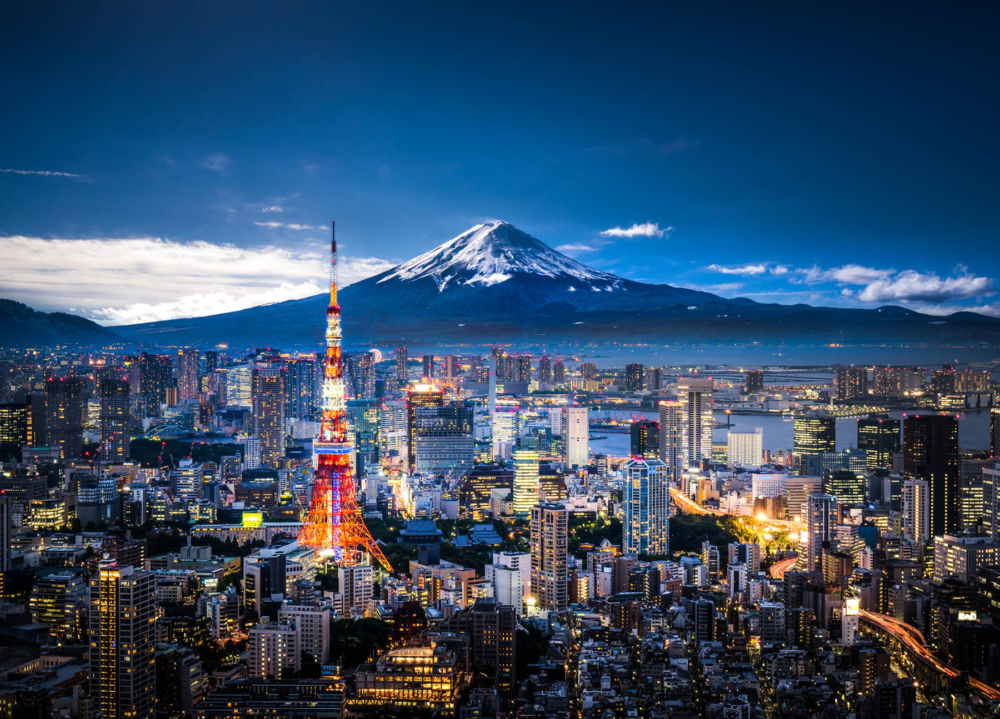

In [7]:
# Photo Source: https://wedc.org/blog/governor-evers-will-lead-trade-mission-
# to-japan-in-september/mt-fuji-and-tokyo-skyline/
Image(filename='Tokyo-Japan-skyline.jpg')

## **1.0 Executive Summary**

The start up boom has given birth to the shared economy – a system based on people sharing resources or services for a price, and potentially leveraging on the Internet to scale.  One of the most successful global examples of this is Airbnb – which has redefined and disrupted the hospitality and real estate industry by allowing hosts to list their properties for guests to book.  Airbnb distinguishes their hosts as Superhosts and Non-Superhosts, and this study focuses on Tokyo, Japan and draws data from InsideAirbnb.com to explore the relationships of listing characteristics, and comparing and contrasting them between these types of hosts. Throughout the paper, we apply data visualization, exploratory data analysis, hypothesis testing and dimensionality reduction techniques.  After these different approaches, the resulting hypothesis testing suggests that Superhost listings tend to be priced higher, and receive better overall reviews than the Non-Superhost counterparts.  Further, it appears that Superhosts’ have been hosting longer and their listings are occupied more frequently compared to Non-Superhosts, based on EDA results.  However, PCA does not seem to show any strong differentiation between Superhosts and Non-Superhosts – and it seems the real differentiator for the host types is mostly being able to comply with Airbnb’s Superhost requirements. 

## **2.0 Introduction**

From futuristic entertainment to old temples, Japan has always been a hotspot destination for travelers from around the world. In 2019, the Japan Tourism Agency said over 31.9 million overseas tourists visited the country.  Tourists can consider staying in capsule hotels or traditional ryokans, but others have found practical value in booking Airbnb accommodations instead for their cost and convenience, particularly in an expensive city like Tokyo. Tourists may also look at several factors, including the host status, which may have been influenced by certain listing characteristics.

**What is a Superhost?**

Superhosts are experienced hosts who provide a shining example for other hosts, and extraordinary experiences for their guests. Once a host reaches Superhost status, a badge will automatically appear on their listing and profile to help prospective guests identify them. Quarterly reviews are done on all hosts to reward them of this sought-after badge.

Superhost status is awarded to hosts that meet the following requirements:

* Completed at least 10 trips or 3 reservations that total at least 100 nights;
* Maintained a 90% response rate or above;
* Maintained a cancellation rate of 1% or below; and
* Maintained, at least, a 4.8 overall rating

## **3.0 Problem Statement**

This study explores the relationships of listing characteristics, and comparing, and contrasting them between Superhosts and Non-Superhosts. We aim to unfold, little by little, the interactions of the Airbnb features and identify which specific characteristics stand out or can be grouped together.

We will apply data visualization, exploratory data analysis, hypothesis testing and dimensionality reduction techniques to scrutinize the data characteristics.

## **4.0 Methodology**

This study consisted of various stages, giving focus on Exploratory Data Analysis (EDA) and dimensionality reduction techniques.

The steps will be described and illustrated in greater detail throughout this report, with the following summary:

1. Convert readily-available web-scraped data as at 20July2021
2. Manipulate, clean and save data as `csv`
3. Execute Exploratory Data Analysis through descriptive statistics, plots, tables, and charts
4. Perform Inferential Statistics to test differences in distribution between Superhosts and Non-Superhosts in terms of price and overall experience rating, as well as independence between Host Type and Room Type

Through these, we to glean insights, compare, and contrast Airbnb listings belonging to both Superhosts and Non-Superhosts.

## **5.0 Data**

### **5.1 Data Source**

**Airbnb**

Airbnb started when two hosts welcomed three guests to their San Francisco home in 2007. Friends, Brian Chesky and Joe Gebbia thought of setting up an air mattress in their living room and turn it into a bed and breakfast. Airbed & Breakfast, now popularly known as Airbnb, was established in 2008 as an online marketplace for lodging, homestays for vacation rentals, and tourism activities. Since then it has grown to 4 million Hosts and welcomed more than 900 million guest arrivals all over the world. As of September 2020, Airbnb has 5.6 million listings over 100,000 cities around the globe.

Airbnb started its operations in Japan in 2013 and has grown rapidly since. However, in 2018, a new homesharing law called `minpaku` required hosts to register and secure permits from the government that caused listings to decrease by up to 80%, from around 60,000. It recovered the following year and raised listings to around 50,000, and additional 23,000 rooms in traditional hospitality categories like hotels and Ryokans. The COVID-19 pandemic has impacted utilization of Airbnb's globally and may slowly recover as the world improves vaccination rates and ease travel restrictions.

**InsideAirbnb.com**

Inside Airbnb is a watchdog website that scrapes and analyzes publicly available information from Airbnb's website. Founded by Murray Cox, InsideAirbnb provides data as well as insights on how Airbnb competes not just with the hotel industry, but also with the residential housing market.

### **5.1 Data Extraction and Preparation**

The data set was extracted from the readily-available raw webscraped information as of 20July2021 from the Airbnb website. This can be accessed via $Jojie$ at `/mnt/data/public/insideairbnb/data.insideairbnb.com/japan/kantō/tokyo/`. Some fields from the original data set were manipulated to retain numeric values, while some were re-assigned with values (i.e. Superhost and Non-Superhost tagging). 

After selecting fields of interest to be used in this study and dropping lines with missing values, 2 data sets were produced:
1. `airbnb20210720.csv` as the main data set with 6,617 rows. One of these has a `minimum_nights` value of 999 and will be dropped in the succeeding sections, but will be added back in the PCA section.
2. `OH_superhost20210720.csv` which contains the boolean host type tagging (0 for Non-Superhost and 1 for Superhost).

The following table details the fields included in this study.

In [8]:
# The data preparation steps have been commented out in this notebook.
# For the subsequent analysis, the processed data sets have been saved as csv
# files and will be imported instead.
lr_select = pd.read_csv('airbnb20210720.csv', index_col=0)
OH_superhost = pd.read_csv('OH_superhost20210720.csv', index_col=0)

# Extract sole line with `minimum_nights` = 999
min_nights_outlier = lr_select[(lr_select.minimum_nights >= 999)]
# Drop row with minimum_nights = 999
lr_select = lr_select[(lr_select.minimum_nights < 999)].dropna()

<center><font size="3"><b>Table 1. Data Set Fields</b></font>
    
|#|Column|Non-Null Count|Dtype|Description
|:---|:------|:----|:-----|:----
|0|name|6616|object|Listing name
|1|host_id|6617|object|Host ID
|2|host_name|6618|object|Host Name
|3|host_is_superhost|6616|object|Re-tagged host type (Superhost/Non-Superhost)
|4|host_listings_count|6616|float64|Total listings under the same host
|5|latitude|6616|float64|Latitude coordinate
|6|longitude|6616|float64|Longitude coordinate
|7|property_type|6616|object|Property Type
|8|room_type|6616|object|Room Type
|9|accommodates|6616|int64|Capacity (per number of pax) of listing
|10|bedrooms|6616|float64|Count of bedrooms in listing
|11|beds|6616|float64|Count of beds in listing
|12|price|6616|float64|Price of listing in Japanese Yean
|13|minimum_nights|6616|int64|Minimum number nights per booking
|14|maximum_nights|6616|int64|Maximum number of nights per booking
|15|availability_365|6616|int64|Listing availability in the next 365 days
|16|number_of_reviews|6616|int64|Number of customer reviews
|17|review_scores_rating|6616|float64|Overall Experience Rating (0 to 5, continuous)
|18|review_scores_accuracy|6616|float64|Accuracy Rating (0 to 5, continuous)
|19|review_scores_cleanliness|6616|float64|Cleanliness Rating (0 to 5, continuous)
|20|review_scores_checkin|6616|float64|Check-in Process Rating (0 to 5, continuous)
|21|review_scores_communication|6616|float64|Host Communication Rating (0 to 5, continuous)
|22|review_scores_location|6616|float64|Location Rating (0 to 5, continuous)
|23|review_scores_value|6616|float64|Value Rating (0 to 5, continuous)
|24|reviews_per_month|6616|float64|Number of customer reviews per month
|25|amenities_ct|6616|int64|Count of listed amenities
|26|days_as_host|6616|int64|Number of days as host as of scraping date
|27|bathrooms|6616|float64|Number of bathrooms in listing
|28|hrr|6616|float64|Host Response Rate

## **6.0 Exploratory Data Analysis**

### **6.1 Geographical Distribution**

<font size="3"><b>Figure 1. Tokyo AirBnb Map by Host Type</b>

In [9]:
# Geo Map of Listings
fig3 = Figure(width=950, height=550)

# Takeshita Street in Shinjuku as Center
m3 = fol.Map(location=[35.6713, 139.7048],
             tiles='cartodbpositron',
             zoom_start=11,
             prefer_canvas=True)

# Landmarks
markers = [('Tokyo Imperial Palace', [35.6838, 139.7507], 'flag'),
           ('Tokyo Station', [35.6814, 139.7661], 'star-empty'),
           ('Tokyo Tower', [35.6586, 139.7454], 'tower'),
           ('Tokyo Skytree', [35.7101, 139.8107], 'camera'),
           ('Senso-ji Temple', [35.7148, 139.7967], 'camera'),
           ('Takeshita Street', [35.6713, 139.7048], 'camera'),
           ('Shinjuku Gyoen National Garden', [35.6852, 139.7101], 'camera'),
           ('Ikebukuro Station', [35.7295, 139.7109], 'star-empty'),
           ('Tokyo Metropolitan Government Building', [35.6896, 139.6921],
            'flag'),
           ('Shibuya Station', [35.6580, 139.7016], 'star-empty'),
           ('Don Quixote Akihabara', [35.7008, 139.7718], 'shopping-cart'),
           ('Tokyo Haneda Airport', [35.5494, 139.7798], 'plane')]

# Plotting the landmark markers onto the map
for i in markers:
    fol.Marker(location=i[1],
               popup=i[0],
               tooltip=i[0],
               icon=fol.Icon(color='darkblue',
                             icon=i[2])).add_to(m3)
fig3.add_child(m3)

superhost = dict()

# For map ticker
for s in pd.unique(lr_select['host_is_superhost']):
    superhost[s] = fol.FeatureGroup(name=s)

# Mean and standard deviation of price - for outlier markers
price_mean = lr_select.price.mean(axis=0)
price_std = lr_select.price.std(axis=0)

# Plotting the data points on the map
for i, r in lr_select.iterrows():
    if r.host_is_superhost == 'Superhost':
        if r.price > price_mean + 3 * price_std:
            c = 'magenta'
        else:
            c = 'red'
    elif r.host_is_superhost == 'Non-Superhost':
        if r.price > price_mean + 3 * price_std:
            c = 'cyan'
        else:
            c = 'blue'
    else:
        c = 'green'

    if r.price > price_mean + 3 * price_std:
        rad = 25
    else:
        rad = 15

    popup_string = ('NAME: ' + r['name'] +
                    f'\nHOST: {r.host_name}\nHOST ID: {r.host_id}')
    m = fol.Circle([r.latitude, r.longitude],
                   radius=rad,
                   color=c,
                   fill_color=c,
                   popup=popup_string,
                   tooltip='¥{:,.2f}'.format(r['price']))
    m.add_to(superhost[r.host_is_superhost])

for s in pd.unique(lr_select['host_is_superhost']):
    superhost[s].add_to(m3)

fol.LayerControl().add_to(m3)
m3

A map, with markers showing listing prices would be the welcome scene in Airbnb's accommodation search screen. It showcases the Superhost listings in <font color='red'>red dots</font>, and Non-Superhost listings in <font color='blue'>blue dots</font>. The reader may zoom in on the map, choose which points to show by host type by clicking on the tile icon found on the upper right corner. Also, the reader may hover over the dots to see the prices and click on them to see the listing name.

Listings tend to clump around the famous neighborhoods around Tokyo, such as:
* Asakusa-Akihabara area, where Tokyo Skytree and Senso-ji are located
* Shinjuku Area
* Ikebukuro

Based on the map, Superhost and Non-Superhost listings do not seem to dominate one or the other in terms of location. Some listings that are near each other also interestingly could belong to the same hosts.

You will notice dots in <span style='background:gray; opacity:0.5'><font color='cyan'>cyan</font></span> and <span style='background:gray; opacity:0.5'><font color='magenta'>magenta</font></span>. These are listings with prices exceeding three standard deviations above the mean price for non-Superhosts, and Supershosts, respectively. These price distributions and outliers will be explored further in the succeeding sections.

### **6.2 Descriptive Statistics**

Descriptive statistics for the whole data set were obtained as an initial step in the exploratory data analysis (EDA). It may be observed that there are features, such as `host_listing_count` and `price` which contain outliers, as determined when the 3-standard-devations rule is applied. This is evident when the maximum values in the data well exceeds three times the standard deviation. However, these were not excluded from the study data set.

<font size="3"><b>Table 2. Descriptive Statistics of Features</b></font>

In [10]:
# Exploratory Data Analysis
# Show all columns of data sets
pd.set_option('display.max_columns', None)
lr_select.describe()

,host_id,host_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,amenities_ct,days_as_host,bathrooms,hrr
count,6.616000e+03,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000
mean,1.791503e+08,13.872430,35.695978,139.736214,4.644800,1.493047,2.756802,17451.577842,2.398881,617.417624,160.602328,33.837515,4.678427,4.749651,4.674819,4.807588,4.804347,4.696398,4.653671,1.199119,26.269952,1333.912636,1.289828,0.971386
std,1.115968e+08,20.350802,0.042306,0.073850,3.118503,1.083490,2.445836,41883.626060,4.573451,481.528319,114.136420,45.961136,0.381428,0.366880,0.431053,0.313443,0.354629,0.336443,0.354858,1.198459,8.044527,696.105988,0.863250,0.118748
min,7.716940e+05,0.000000,35.540750,139.129360,1.000000,1.000000,0.000000,1050.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.020000,1.000000,27.000000,0.000000,0.000000
25%,6.832835e+07,2.000000,35.683877,139.701340,2.000000,1.000000,1.000000,5000.000000,1.000000,90.000000,72.000000,5.000000,4.560000,4.670000,4.570000,4.750000,4.750000,4.570000,4.540000,0.410000,21.000000,785.000000,1.000000,1.000000
50%,1.850640e+08,7.000000,35.702670,139.732535,4.000000,1.000000,2.000000,9000.000000,1.000000,365.000000,149.000000,17.000000,4.770000,4.850000,4.800000,4.900000,4.900000,4.770000,4.710000,0.920000,26.000000,1188.500000,1.000000,1.000000
75%,2.645975e+08,18.000000,35.720363,139.788695,6.000000,2.000000,4.000000,17250.000000,2.000000,1125.000000,252.000000,44.000000,4.910000,4.970000,4.960000,5.000000,5.000000,4.930000,4.870000,1.600000,31.000000,1915.000000,1.500000,1.000000
max,4.088362e+08,129.000000,35.830640,139.911580,16.000000,30.000000,56.000000,1000000.000000,60.000000,1125.000000,365.000000,489.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,23.440000,68.000000,3670.000000,24.000000,1.000000


<font size="3"><b>Figure 2. EDA Dashboard for Categorical Features</b></font>

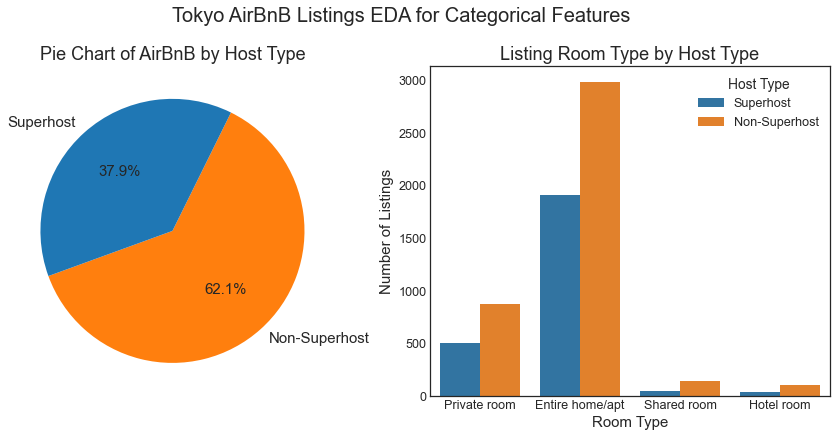

In [11]:
# Dashboard
sns.set_context('notebook', font_scale=1.15)
plt.style.use('seaborn-white')
fig = plt.figure(constrained_layout=True, figsize=(12, 10))
fig.suptitle('Tokyo AirBnB Listings EDA for Categorical Features',
             fontsize=20, y=1.05)
gs = fig.add_gridspec(4, 4)
ax0 = fig.add_subplot(gs[0:2, :2])
ax1 = fig.add_subplot(gs[0:2, 2:])

# Pie Chart
ax0.pie(lr_select.host_is_superhost.value_counts(),
        labels=lr_select.host_is_superhost.value_counts().index,
        autopct='%1.1f%%',
        startangle=-160,
        colors=['tab:orange', 'tab:blue'],
        textprops={'fontsize': 15})
ax0.set_title('Pie Chart of AirBnB by Host Type', fontsize=18)

# Countplot - Room Type
sns.countplot(x=lr_select.room_type,
              hue=lr_select.host_is_superhost,
              ax=ax1)
ax1.set_title('Listing Room Type by Host Type', fontsize=18)
ax1.set_xlabel('Room Type', fontsize=15)
ax1.set_ylabel('Number of Listings', fontsize=15)
ax1.legend(title='Host Type')

plt.show()

From the plots, the following may be observed.
* Majority of the listings belong to Non-Superhosts.
* Majority of listings are `Entire home/apt`.

It also appears that room type distributions of the host types are quite similar to each other, regardless of whether rooms are managed by a Superhost or not. Rather than rely on visual inspection however, we will explore whether the Superhost vs Non-Superhost features are statistically independent in a subsequent section. For now, we tabulate the conditional and marginal probabities based on a frequentist approach.


<font size="3"><b>Table X. Frequency Table for Host Type and Room Type</b></font>

In [12]:
contingency_table = lr_select.groupby(['host_is_superhost', 'room_type'])['room_type'].count().unstack()
contingency_table['Total'] = contingency_table.sum(axis=1)
contingency_table.loc['Total'] = contingency_table.sum(axis=0)
contingency_table

room_type,Entire home/apt,Hotel room,Private room,Shared room,Total
host_is_superhost,,,,,
Non-Superhost,2988,104,877,142,4111
Superhost,1908,41,506,50,2505
Total,4896,145,1383,192,6616


<font size="3"><b>Table X. Joint and Marginal Probabilities for Host Type and Room Type</b></font>

In [13]:
prob_table = contingency_table / contingency_table.loc['Total', 'Total']
prob_table

room_type,Entire home/apt,Hotel room,Private room,Shared room,Total
host_is_superhost,,,,,
Non-Superhost,0.451632,0.015719,0.132557,0.021463,0.621372
Superhost,0.288392,0.006197,0.076481,0.007557,0.378628
Total,0.740024,0.021917,0.209039,0.029021,1.000000


<font size="3"><b>Figure 3. EDA Dashboard for Discrete Features</b></font>

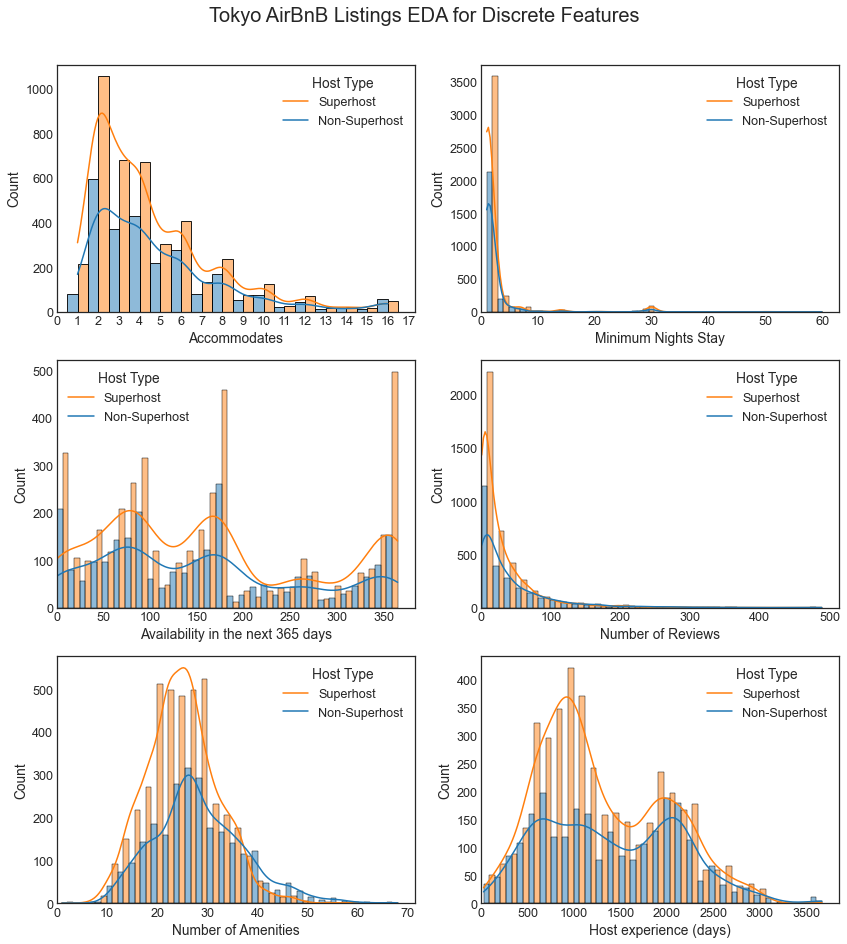

In [14]:
fig, ax = plt.subplots(3, 2, figsize=(12, 13))
fig.suptitle('Tokyo AirBnB Listings EDA for Discrete Features',
             fontsize=20, y=1.01)

sns.histplot(x=lr_select.accommodates, bins=20,
             hue=lr_select.host_is_superhost, multiple='dodge', ax=ax[0, 0],
             discrete=True, kde=True)
ax[0, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[0, 0].set_xticks(range(0, 18))
ax[0, 0].set_xlim(0,)
ax[0, 0].set_xlabel('Accommodates')

sns.histplot(x=lr_select.minimum_nights, bins=30,
             hue=lr_select.host_is_superhost, multiple='dodge', ax=ax[0, 1],
             kde=True)
ax[0, 1].legend(title='Host Type', loc='upper right', labels=['Superhost', 'Non-Superhost'])
ax[0, 1].set_xlim(0,)
ax[0, 1].set_xlabel('Minimum Nights Stay')

sns.histplot(x=lr_select.availability_365, bins=30,
              hue=lr_select.host_is_superhost, ax=ax[1, 0], multiple='dodge',
              kde=True)
ax[1, 0].legend(title='Host Type', loc='best',
                labels=['Superhost', 'Non-Superhost'])
ax[1, 0].set_xticks(range(0, 400, 50))
ax[1, 0].set_xlim(0,)
ax[1, 0].set_xlabel('Availability in the next 365 days')

sns.histplot(x=lr_select.number_of_reviews, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[1, 1], multiple='dodge',
             kde=True)
ax[1, 1].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[1, 1].set_xlim(0,)
ax[1, 1].set_xlabel('Number of Reviews')

sns.histplot(x=lr_select.amenities_ct, bins=30,
            hue=lr_select.host_is_superhost, ax=ax[2, 0], multiple='dodge',
             kde=True)
ax[2, 0].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[2, 0].set_xlim(0,)
ax[2, 0].set_xlabel('Number of Amenities')

sns.histplot(x=lr_select.days_as_host, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[2, 1], multiple='dodge',
             kde=True)
ax[2, 1].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[2, 1].set_xlim(0,)
ax[2, 1].set_xlabel('Host experience (days)')

fig.tight_layout()
plt.show()

* Distribution of availability in the next 365 days for Superhosts seems right-skewed compared to availability of non-Superhosts. In either case, the distribution appears multi-modal, very likely depending on the calendar settings of the different hosts (hosts are able to restrict booking availability to the next month, quarter, half-year, or full year).

***(insert observations)***

<font size="3"><b>Figure 4. EDA Dashboard for Continuous Features</b></font>

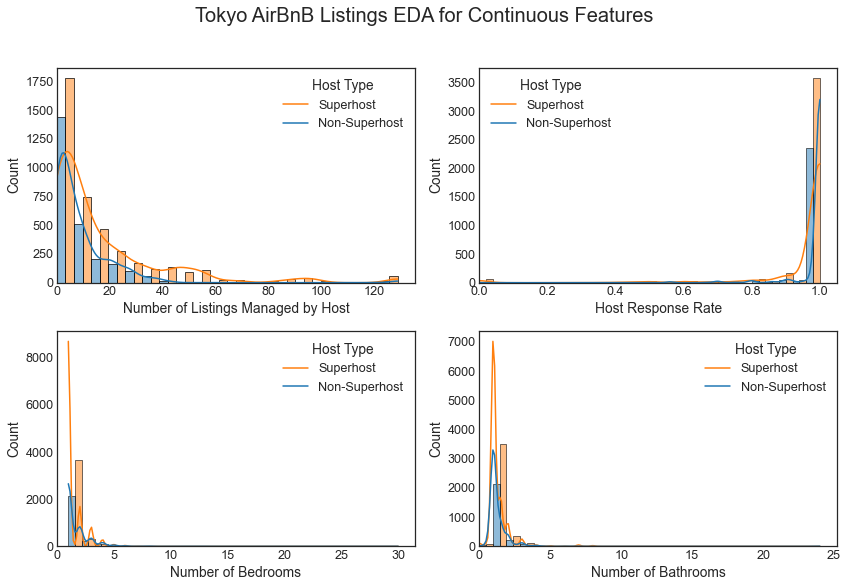

In [15]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Tokyo AirBnB Listings EDA for Continuous Features',
             fontsize=20, y=1.02)

sns.histplot(x=lr_select.host_listings_count, bins=20, multiple='dodge', kde=True,
            hue=lr_select.host_is_superhost, ax=ax[0, 0])
ax[0, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[0, 0].set_xlabel('Number of Listings Managed by Host')
ax[0, 0].set_xlim(0,)

sns.histplot(x=lr_select.hrr, bins=25, multiple='dodge', kde=True,
            hue=lr_select.host_is_superhost, ax=ax[0, 1])
ax[0, 1].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[0, 1].set_xlabel('Host Response Rate')
ax[0, 1].set_xlim(0,)

sns.histplot(x=lr_select.bedrooms, bins=25, multiple='dodge', kde=True,
            hue=lr_select.host_is_superhost, ax=ax[1, 0])
ax[1, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[1, 0].set_xlabel('Number of Bedrooms')
ax[1, 0].set_xlim(0,)

sns.histplot(x=lr_select.bathrooms, bins=25, multiple='dodge', kde=True,
            hue=lr_select.host_is_superhost, ax=ax[1, 1])
ax[1, 1].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[1, 1].set_xlabel('Number of Bathrooms')
ax[1, 1].set_xlim(0,)

plt.tight_layout()
plt.show()

***(insert observations)***

The distributions of price and ratings are of particular interest in this exploratory data analysis, and so we focus on these in the subsequent sections.

### 6.3 Price Distributions

As noted previously, there are listings which are outliers in terms of booking rates, with prices well exceeding three standard deviations above the mean. (Since the data is non-negative, and the standard deviation exceeds the mean, we can only consider positive-side outliers.)

The succeeding table shows a summary of these outlying listings, using quartiles to describe the outliers' price distribution.


<font size="3"><b>Table X. Number and Distribution of Price Outliers</b></font>

In [16]:
# Price Outliers

def percentile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'percentile_{:2.0f}'.format(n*100)
    return percentile_


outliers = (lr_select[lr_select.price > price_mean + 3 * price_std].
            pivot_table(index='host_is_superhost',
                        values='price',
                        aggfunc=['count', 'min', percentile(.25),
                                 'median', percentile(.75), 'max']))
outliers.columns = ['count', 'min', '25%', '50%', '75%', 'max']
outliers

,count,min,25%,50%,75%,max
host_is_superhost,,,,,,
Non-Superhost,43,145714.0,187143.0,200000.0,255000.0,1000000.0
Superhost,28,145714.0,150000.0,176714.0,282857.0,600000.0


Outliers aside, we are also interested in exploring the price distributions of Airbnb listings in Tokyo, before we proceed to comparing the mean price of Superhosts vs Non-Superhosts. Similar to the previous EDA plots, we construct distribution plots of prices for both types of hosts.

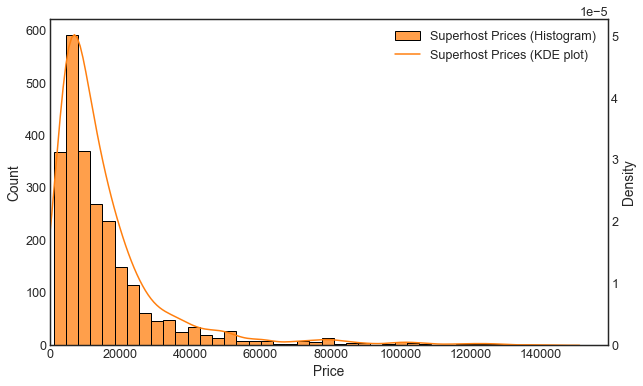

In [17]:
superhost_price = lr_select[(lr_select.price < price_mean + 3 * price_std) &
                            (lr_select.host_is_superhost == 'Superhost')]['price']

fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_price, bins=40, ax=ax1, color='tab:orange',
             label='Superhost Prices (Histogram)')
ax1.set_xlabel('Price')
ax2 = ax1.twinx()
sns.kdeplot(x=superhost_price, ax=ax2, label='Superhost Prices (KDE plot)',
            color='tab:orange')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,)
plt.show()

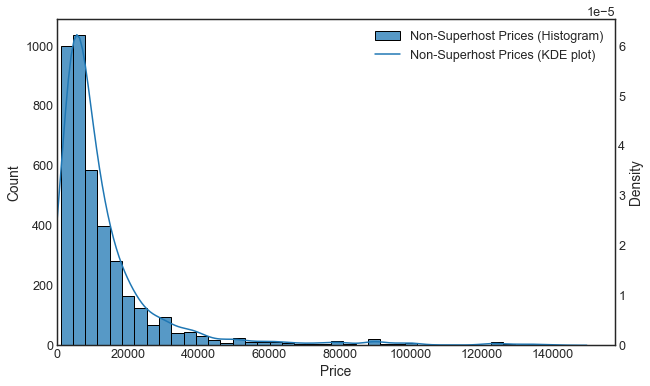

In [18]:
nonsuperhost_price = lr_select[(lr_select.price < price_mean + 3 * price_std) &
                            (lr_select.host_is_superhost == 'Non-Superhost')]['price']

fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_price, bins=40, ax=ax1,
             label='Non-Superhost Prices (Histogram)')
ax1.set_xlabel('Price')

ax2 = ax1.twinx()
sns.kdeplot(x=nonsuperhost_price, ax=ax2,
            label='Non-Superhost Prices (KDE plot)')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,)
plt.show()

It appears from both plots that the price distribution is heavily right-tailed, with the bulk of listings having prices below 20000 Japanese yen, but with some very expensive listings skewing the distributions to the right. It also appears based on visual inspection the the prices for Superhosts tends to be somewhat higher compared to non-Superhosts.

To provide more rigor on these observations, we will the explore and compare these  price distributions in greater detail in a later section.


Before moving on to other features, it would also be interesting to explore the geographical distribution of Airbnb listing prices, to see if certain areas of Tokyo tend to be more expensive than others.

<font size="3"><b>Figure X. Price Heat Map - Superhost, Excluding Outliers</b>

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


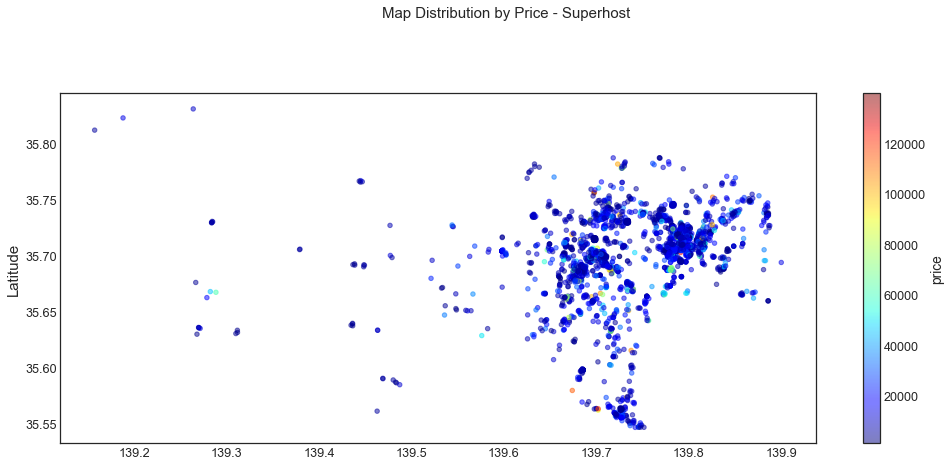

In [19]:
plt.style.use('seaborn-white')
(lr_select[(lr_select.host_is_superhost == 'Superhost') &
           (lr_select.price <= price_mean + 3 * price_std)].
 plot(kind='scatter',
      x='longitude',
      y='latitude',
      label='id',
      c='price',
      cmap=plt.get_cmap('jet'),
      colorbar=True,
      alpha=0.5,
      figsize=(15, 7),
      legend=None))
plt.suptitle("Map Distribution by Price - Superhost", fontsize=15)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.tick_params(bottom=True, labelbottom=True)
plt.tight_layout(pad=3)
plt.show()

<font size="3"><b>Figure X. Price Heat Map - Non-Superhost, Excluding Outliers</b></font>

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


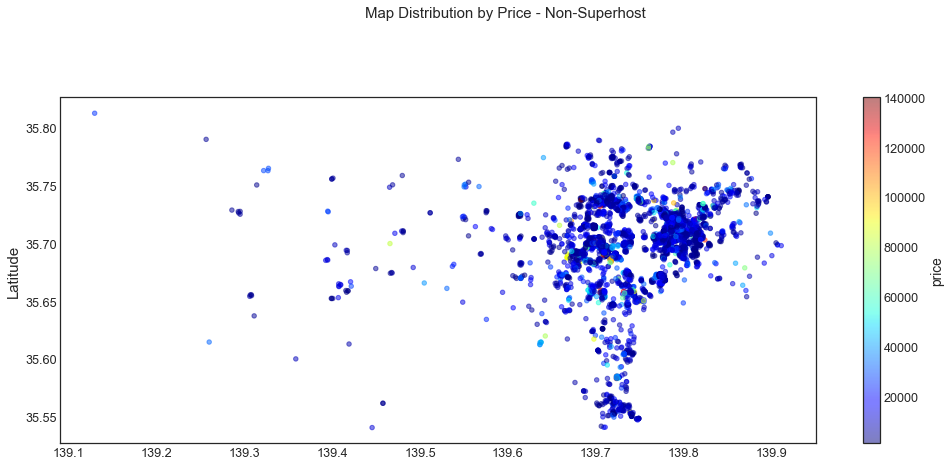

In [20]:
# Price Heatmap - Non-Superhost (excluding outliers)
plt.style.use('seaborn-white')
(lr_select[(lr_select.host_is_superhost == 'Non-Superhost') &
           (lr_select.price <= price_mean + 3 * price_std)].
 plot(kind='scatter',
      x='longitude',
      y='latitude',
      label='id',
      c='price',
      cmap=plt.get_cmap('jet'),
      colorbar=True,
      alpha=0.5,
      figsize=(15, 7),
      legend=None))
plt.suptitle("Map Distribution by Price - Non-Superhost", fontsize=15)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.tick_params(bottom=True, labelbottom=True)
plt.tight_layout(pad=3)
plt.show()

* The map is dominated by dark blue dots, reinforcing the earlier observation from the distribution plots that prices are heavily skewed.
* The area or district does seem to have any effect on price since there are no concentrated specs of lighter or hotter colors.
* Listings on the sparser side of the map seem to have higher prices relative to those on the more dense areas, where there is more competition and options.
* On the surface, the lighter specs appear to be spread out randomly throughout Tokyo.

### **6.4 Ratings Distributions**

**How do Airbnb ratings work?**

On top of written reviews, guests can also evaluate their whole experience by giving star ratings, ranging from 0 to 5. These are then aggregated and summarized by Airbnb to be available to the hosts, and even get posted on their listing profiles.

These are the categories, and things that guests need to keep in mind as they give ratings:
* <i><b>Overall Experience</b></i>
    - How was it?
* <i><b>Accuracy</b></i>
    - Are the posted details, photos, and information accurate and up to date?
* <i><b>Cleanliness</b></i>
    - Did the listing meet Airbnb's cleanliness standards?
* <i><b>Check-in</b></i>
    - Was it easy and seamless?
* <i><b>Communication</b></i>
    - Did the host respond to guest queries promptly?
* <i><b>Location</b></i>
    - Was the guest made aware of safety, transportation, points of interest and special considerations like
    noise or other situations that might affect their stay?
* <i><b>Value</b></i>
    - Was it worth the price?
    
**Ratings Validation and Counter-Check Measures**
    
According to Airbnb's website, they have launched a tool that validates and detects outlier reviews or one-off bad reviews, as response to feedback from hosts. A sample scenario would be high scores across categories, but a 2-star rating on Overall Experience. When this happens, the guest receives a notification and enables them to revisit and change their review ratings.

The same step is done with Location and Value ratings, which happens when guests rate a listing with less than 3 stars. The guest will receive a notification to further probe the reason for the low rating by asking the following questions, respectively:
* Was the listing not described accurately?
* What would have made this listing a better value?
    
Airbnb took these extra steps, especially for Location, since hosts raised issues on being penalized on a rating aspect that is out of their control.

<font size="3"><b>Table 3. Mean Ratings Per Category</b></font>

In [21]:
scores_df = lr_select[['host_is_superhost',
                       'review_scores_rating',
                       'review_scores_accuracy',
                       'review_scores_cleanliness',
                       'review_scores_checkin',
                       'review_scores_communication',
                       'review_scores_location',
                       'review_scores_value']]

scores_summary = scores_df.groupby('host_is_superhost').mean().reset_index()
scores_summary = scores_summary.T.iloc[1:, :].rename(columns={0: 'Non-Superhost',
                                                              1: 'Superhost'})
display(scores_summary)

,Non-Superhost,Superhost
review_scores_rating,4.591185,4.821601
review_scores_accuracy,4.686419,4.853421
review_scores_cleanliness,4.587402,4.818279
review_scores_checkin,4.764488,4.878319
review_scores_communication,4.750956,4.891968
review_scores_location,4.664841,4.748188
review_scores_value,4.603768,4.735569


***(insert discussion)***

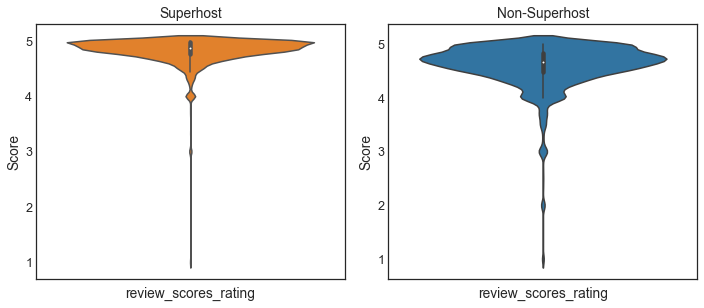

In [22]:
superhost_scores = scores_df[scores_df['host_is_superhost'] == 'Superhost']
nonsuperhost_scores = scores_df[scores_df['host_is_superhost'] == 'Non-Superhost']

fig, ax = plt.subplots(1, 2, figsize=(10, 4.5))
sns.violinplot(y=superhost_scores['review_scores_rating'], color='tab:orange',
               ax=ax[0], label='Superhost')
ax[0].set_xlabel('review_scores_rating')
ax[0].set_title('Superhost')
ax[0].set_ylabel('Score')
# ax[0].legend(title='Superhost', loc='lower right')

sns.violinplot(y=nonsuperhost_scores['review_scores_rating'], ax=ax[1],
               label='Non-Superhost')
ax[1].set_xlabel('review_scores_rating')
ax[1].set_title('Non-Superhost')
ax[1].set_ylabel('Score')
# ax[1].legend(title='Non-Superhost', loc='lower right')

plt.tight_layout()
plt.show()

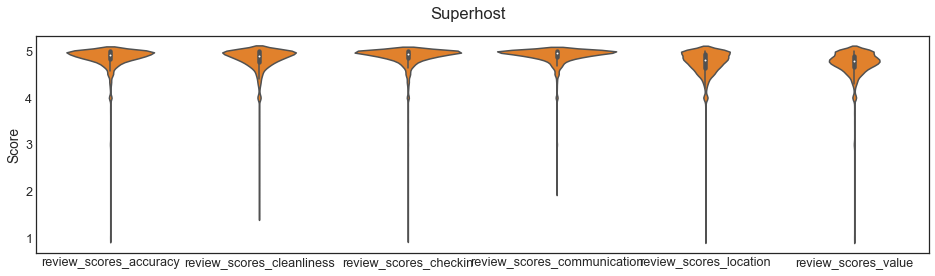

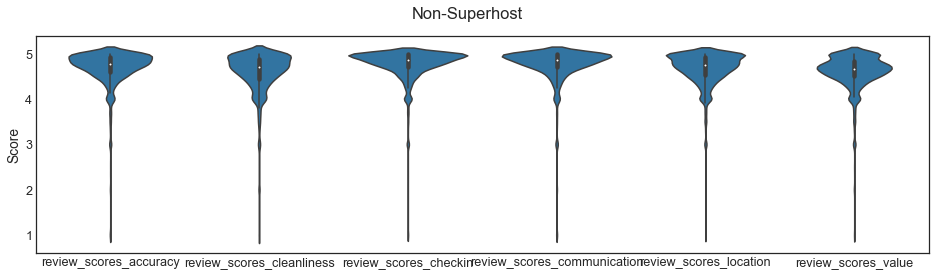

In [23]:
fig, ax = plt.subplots(figsize=(16, 4))
sns.violinplot(data=superhost_scores.iloc[:, 2:], color='tab:orange')
ax.set_ylabel('Score')
fig.suptitle('Superhost')
plt.show()

fig, ax = plt.subplots(figsize=(16, 4))
sns.violinplot(data=nonsuperhost_scores.iloc[:, 2:], color='tab:blue')
ax.set_ylabel('Score')
fig.suptitle('Non-Superhost')
plt.show()

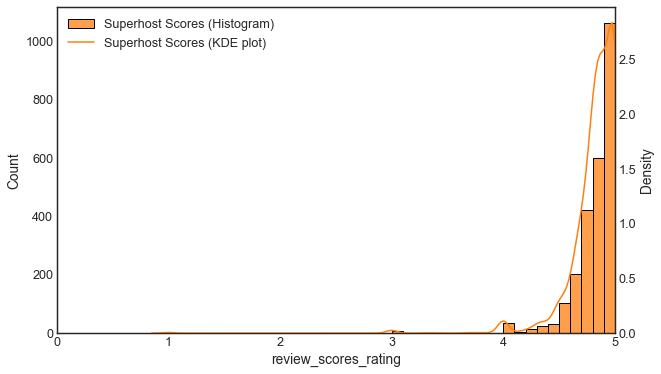

In [24]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_scores['review_scores_rating'], bins=40,
             ax=ax1, color='tab:orange',
             label='Superhost Scores (Histogram)')
ax1.set_xlabel('review_scores_rating')
ax2 = ax1.twinx()
sns.kdeplot(x=superhost_scores['review_scores_rating'], ax=ax2,
            label='Superhost Scores (KDE plot)',
            color='tab:orange')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,5)
plt.show()

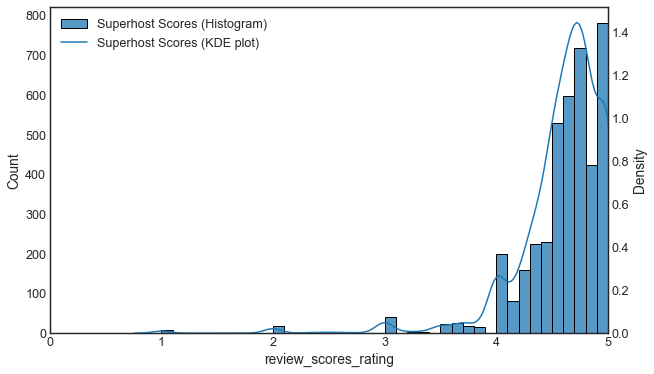

In [25]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_scores['review_scores_rating'], bins=40,
             ax=ax1, color='tab:blue',
             label='Superhost Scores (Histogram)')
ax1.set_xlabel('review_scores_rating')
ax2 = ax1.twinx()
sns.kdeplot(x=nonsuperhost_scores['review_scores_rating'], ax=ax2,
            label='Superhost Scores (KDE plot)',
            color='tab:blue')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,5)
plt.show()

**How do Superhost and Non-Superhost listings compare on ratings?**

A cursory check would suggest that Superhost listings perform better than those of Non-Superhosts, based on ratings. It might be expected as well, since the automatic Superhost status requires at least a 4.8 Overall Experience Rating. However, one might not be able to gauge if there is significant difference between the scores. How different is as 4.5 versus a 4.8? In answering this question, one has to consider that the distributions do not conform to any of the more familiar distribution, hence non-parametric tests may need to be applied. We shall explore this further in the succeeding sections.

### **6.5 Correlations of Features**

It would be interesting to see how these features behave with each other linearly, so correlation heat maps were produced. We will follow below heuristic as we examine and interpret these linear relationships.

<br></br>
<center><font size="2.5"><b>Table 4. Correlation Coefficient Interpretation</b></font></center>

|Correlation Coefficient|Interpretation of Linear Relationship|
|:---|:---|
|r = -1|Perfect negative|
|-1 < r <= -0.7|Strong negative|
|-0.7 < r <= -0.3|Moderate negative|
| -0.3 < r < 0|Weak negative|
|r = 0|No relationship|
|0 < r <  0.3|Weak positive|
|0.3 <= r < 0.7|Moderate positive|
|0.7 <= r < 1|Strong positive|
|r = 1|Perfect positive|

In [26]:
# Selected fields for correlation analysis and dimensionality reduction
fields_corr = ['hrr',
               'host_listings_count',
               'latitude',
               'longitude',
               'accommodates',
               'bathrooms',
               'bedrooms',
               'beds',
               'amenities_ct',
               'days_as_host',
               'price',
               'minimum_nights',
               'availability_365',
               'review_scores_rating',
               'review_scores_accuracy',
               'review_scores_cleanliness',
               'review_scores_checkin',
               'review_scores_communication',
               'review_scores_location',
               'review_scores_value',
               'number_of_reviews']

<font size="3"><b>Figure 6. Correlation Heat Map - Non-Superhost</b>

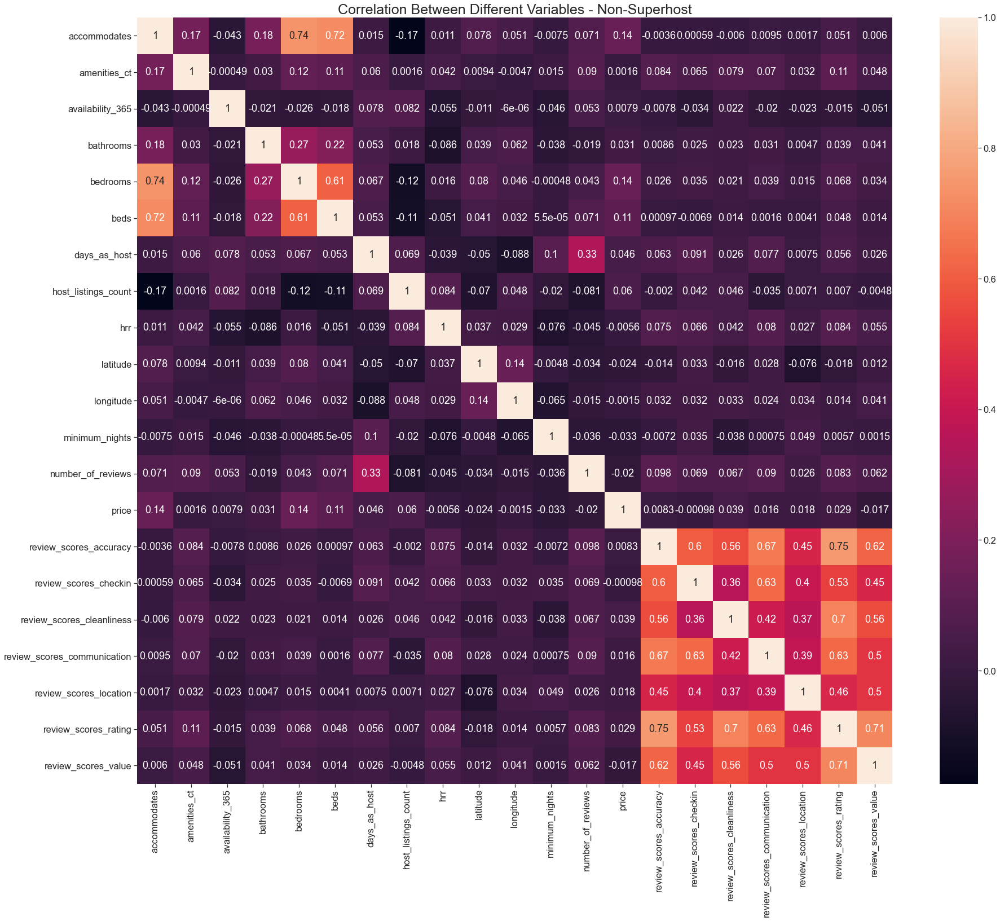

In [27]:
# Correlation heatmap - Non-Superhost
corr_data = lr_select[lr_select.host_is_superhost == 'Non-Superhost']
sns.set_context('notebook', font_scale=1.5)
corr = corr_data[sorted(fields_corr)].corr()
plt.figure(figsize=(30, 25))
plt.title("Correlation Between Different Variables - Non-Superhost",
          fontsize=25)
sns.heatmap(corr, annot=True)
plt.show()

An initial glance would draw one's attention to the review scores, having the hotter colors. Though they measure different facets of a guest's stay, it is quite expected of them to be positively correlated, as discussed in the previous section.


**Review Scores**
* The scores show moderate to strong positive linear relationships with each other.
* The strongest positive linear relationship between review scores can be seen between `review_scores_rating` and `review_scores_accuracy`. While the weakest can be seen between `review_scores_cleanliness` and `review_scores_checkin`.
* As discussed in the previous section, it is not surprising to see that among all review scores, the `review_scores_rating` has the weakest linear relationship with `review_scores_location`. This is where hosts usually have issues with reviews.



**Notable Correlations**
* <i>"Capacity"</i> features such as, `accommodates`, `bedrooms`, and `beds` have moderate to strong positive linear relationships with each other.
* Number of reviews tends to increase over time. Though true for above, the relationship between `number_of_reviews` and `days_as_host` is weak.

<font size="3"><b>Figure 7. Correlation Heat Map - Superhost</b>

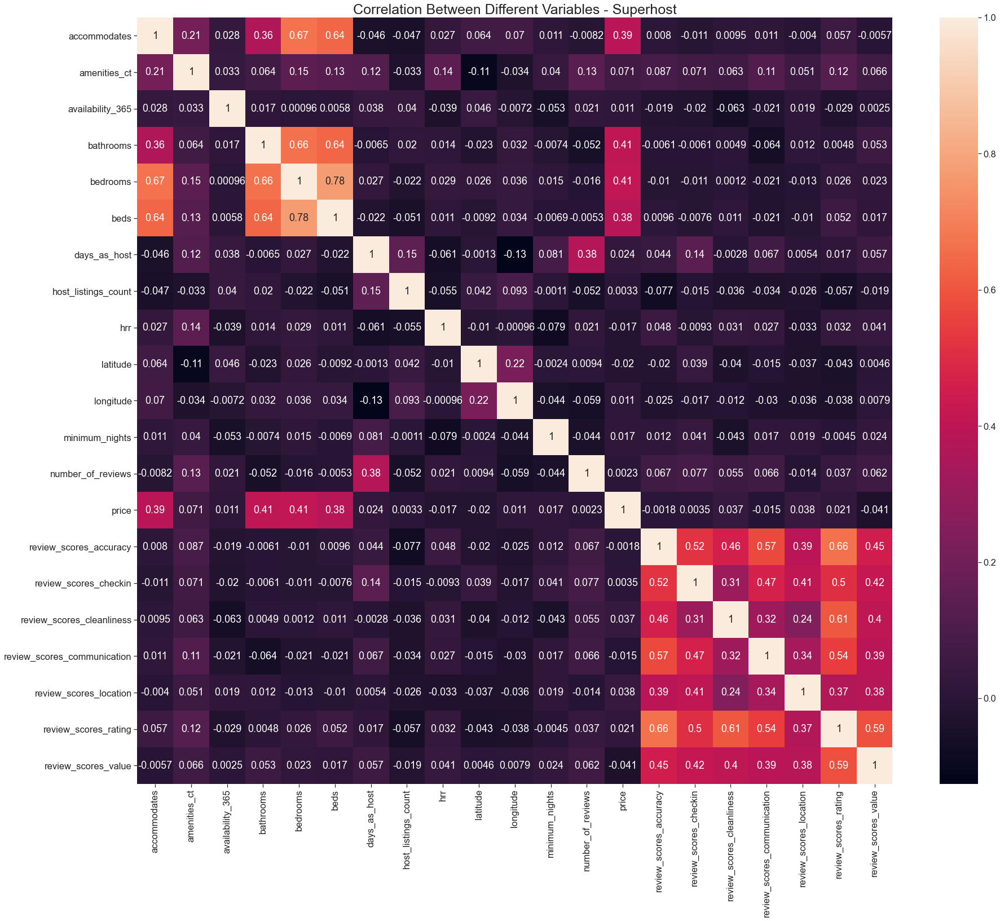

In [28]:
# Correlation Heatmap - Superhost
corr_data = lr_select[lr_select.host_is_superhost == 'Superhost']
sns.set_context('notebook', font_scale=1.5)
corr = corr_data[sorted(fields_corr)].corr()
plt.figure(figsize=(30, 25))
plt.title("Correlation Between Different Variables - Superhost",
          fontsize=25)
sns.heatmap(corr, annot=True)
plt.show()

Similar to Non-Superhosts, all review scores show positive linear relationship with each other. However, the relationships appear to be weaker. This goes against the thinking that since Superhost listings are expected to maintain higher ratings, then review score relationships should be stronger. This may be worth investigating further, but already beyond the scope of this study.

The linear relationship of `accommodates` to `beds` and `bedrooms` seem to be weaker for Superhosts, but positive correlations between `bed` and `bedrooms` have become stronger. Superhosts might have less beds per bedroom in their listings or that more of these listings follow a one-bed-one-bedroom set-up. `bathrooms` also showed a much stronger relationship with `bedrooms` and `beds`.

Another notable difference would be the relationship of `price` with `bathrooms`, `beds`, and `bedrooms` that has become stronger for Superhost listings.

## **7.0 Hypothesis Testing**

Combing through the data, one might ask: Do Superhosts tend to manage different types of property compared to non_Superhosts? Is there a price difference between their listings; i.e. are Superhost listings are priced relatively more expensive than those of Non-Superhosts, or vice versa? On customer reviews, which group has higher ratings? These may be answered by doing hypothesis testing.

### **7.1 Tests of Independence**

To test for independence between a host being tagged as a Superhost or non-Superhost, we will apply the Chi-Squared Test for Independence, using the following hypotheses:

<br>
<center>$H_0$: Host Type and Room Type are independent</center>
<center>$H_1$: Host Type and Room Type are not independent</center>
<br>

We will also apply significance level of $\alpha = 0.05$ for this and other subsequent hypothesis tests.

To proceed with the Chi-Squared test, we compare the contingency table of observed frequencies, against the table of expected values, assuming independence.

<font size="3"><b>Table X. Observed Count per Host Type and Room Type</b>

In [29]:
observed = lr_select.groupby(['host_is_superhost', 'room_type'])['room_type'].count().unstack()
display(observed)

room_type,Entire home/apt,Hotel room,Private room,Shared room
host_is_superhost,,,,
Non-Superhost,2988,104,877,142
Superhost,1908,41,506,50


<font size="3"><b>Table X. Expected Count per Host Type and Room Type, Assuming Independence</b>

In [30]:
expected = observed.copy()
for col in observed.columns:
  for row in observed.index:
    expected.loc[row, col] = (observed.loc[row].sum()*observed.loc[:, col].sum() / 
                              np.array(observed).sum())
display(expected)

room_type,Entire home/apt,Hotel room,Private room,Shared room
host_is_superhost,,,,
Non-Superhost,3042.23942,90.099002,859.358071,119.303507
Superhost,1853.76058,54.900998,523.641929,72.696493


Comparing the tables, we can see that Non-Superhosts manage more `Entire home/apt`, whereas Superhosts manage more `Hotel room`, `Private room`, and `Shared room` than we would expect if the variables were independent.

To determine if the differences between observed and expected values are significant, we compute the Chi-Squared statistic and determine the p-value.

In [31]:
Q = np.array((observed - expected)**2 / expected).sum()
df = (observed.shape[0] - 1)*(observed.shape[1] - 1)
p_value = 1 - chi2.cdf(Q, df)

print('Chi-Squared Statistic:', Q)
print('p-value:', p_value)

Chi-Squared Statistic: 20.578907735508796
p-value: 0.0001287486746923694


Thus, for a significance level of $\alpha = 0.05$, we reject the null hypothesis that Host Type and Room Type are independent. In other words, it appears that Non-Superhosts are more likely to manage entire homes and apartments, and Superhosts are more likely to utilize other property types for their Airbnb listings.

### **7.2 Tests of Normality**

As previously mentioned, we are interested in exploring the prices and rating of Superhosts and non-Superhosts, and checking whether these are significant.  First however, we explore the distributions of these features, to see if they are normally distributed, or if they conform to some other distribution, before we proceed to directly comparing the two groups.

Let us recall the distribution plots constructed earlier, showing for now only the kernel density estimates without binning the frequency counts.

<font size="3"><b>Figure 8. KDE Plots of Price and Overall Experience Review Score</b>

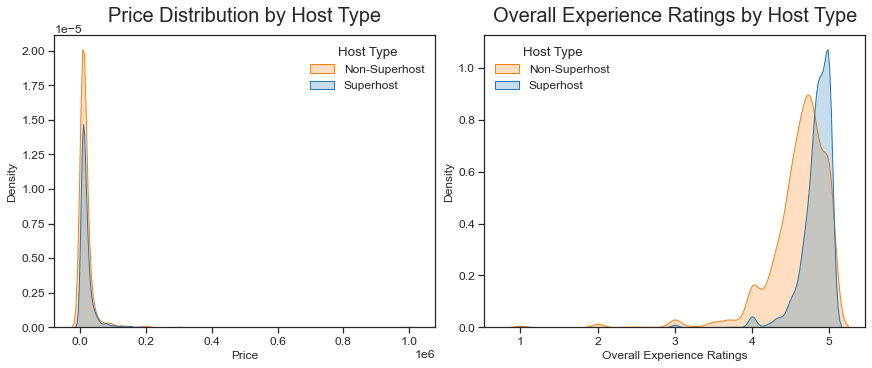

In [32]:
plt.style.use('seaborn-white')
sns.set_context('notebook', font_scale=1.1)
fig = plt.figure(constrained_layout=True, figsize=(12, 5))
gs = fig.add_gridspec(1, 2)
ax0 = fig.add_subplot(gs[:, :1])
ax1 = fig.add_subplot(gs[:, 1:])

# KDE Plot of Price by Host Type
sns.kdeplot(data=lr_select,
            x='price',
            hue='host_is_superhost',
            fill=True,
            legend=False,
            ax=ax0)
ax0.legend(title='Host Type',
           labels=['Non-Superhost', 'Superhost'],
           loc='upper right',
           fontsize=12)
ax0.set_title('Price Distribution by Host Type', fontsize=20, y=1.025)
ax0.set_xlabel('Price', fontsize=12)
ax0.set_ylabel('Density', fontsize=12)

# KDE Plot of Overall Experience Rating by Host Type
sns.kdeplot(data=lr_select,
            x='review_scores_rating',
            hue='host_is_superhost',
            fill=True,
            legend=False,
            ax=ax1)
ax1.legend(title='Host Type',
           labels=['Non-Superhost', 'Superhost'],
           loc='upper left',
           fontsize=12)
ax1.set_title('Overall Experience Ratings by Host Type', fontsize=20, y=1.025)
ax1.set_xlabel('Overall Experience Ratings', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
plt.show()

The KDE graphs show that `price` and `review_scores_rating` are asymmetric, for both host types. In order to guide us with which test to implement, we test first if they are normally distributed.

Normality tests are used to determine if the sample data has been drawn from a normally-distributed population. In this study, we used three general normality tests, namely:

* Anderson-Darling - a modification of the Kolmogorov-Smirnov (K-S) test and gives more weight to the tails than does the K-S test.
* Shapiro-Wilk - small values of this statistic are evidence of departure from normality.
* D'Agostino's $K^2$ - dubbed as an omnibus test for normality that uses Skewness and Kurtosis.

Both Anderson-Darling and Shapiro-Wilk are affected by ties, but D'Agostino's $K^2$ is not. In the succeeding section, we shall test the following hypotheses that `price`, and `review_scores_rating` for Superhosts and Non-Superhosts are normally-distributed, at 95% confidence level ($\alpha$= 0.05):  
<br>
<center>$H_0$: The data follows a Normal Distribution</center>
<center>$H_1$: The data does not follow a Normal Distribution</center>

In [33]:
# Hypothesis testing for price and review scores
a = lr_select[lr_select.host_is_superhost == 'Superhost']['price']
b = lr_select[lr_select.host_is_superhost == 'Non-Superhost']['price']
c = (lr_select[lr_select.host_is_superhost == 'Superhost']
     ['review_scores_rating'])
d = (lr_select[lr_select.host_is_superhost == 'Non-Superhost']
     ['review_scores_rating'])

In [34]:
# Normality Testing
def normality(data, alpha=5):
    """Return a pandas.DataFrame of normality test results.

    Applies the following nomality tests:
        1. Shapiro-Wilk
        2. D'Agostino's K^2
        3. Anderson-Darling

    Parameters
    ----------
    data : pandas.DataFrame
        Data set to be tested

    alpha : int or float
        Level of significance in %

    Returns
    -------
    test_table : pandas.DataFrame
        Data frame containing test results
    """

    test_table = pd.DataFrame()
    tests = [shapiro, normaltest, anderson]
    names = ["Shapiro-Wilk", "D’Agostino’s K^2", "Anderson-Darling"]
    for i, t in enumerate(tests):
        test = names[i]
        if i < 2:
            stat, pvalue = t(data)
            critical = "N/A"
            if pvalue < alpha:
                decision = "Reject H0"
            else:
                decision = "Do Not Reject H0"
        else:
            ad = t(data)
            stat = ad.statistic
            pvalue = "N/A"
            try:
                critical = ad.critical_values[ad.significance_level.
                                              tolist().index(alpha)]
            except ValueError:
                critical = "N/A"

            if critical == "N/A":
                decision = "Invalid Alpha"
            elif stat > critical:
                decision = "Reject H0"
            else:
                decision = "Do Not Reject H0"

        test_table = pd.concat([test_table,
                                pd.DataFrame(
                                   {'Statistic': stat,
                                    'P-Value': pvalue,
                                    'Critical Value': critical,
                                    'Decision': decision},
                                   index=[names[i]])],
                               axis=0)
    return test_table

<font size="3"><b>Table 5. Test of Normality Results</b></font>

In [35]:
# For Price
print("1. PRICE - Superhost")
display(normality(a))
print("2. PRICE - Non-Superhost")
display(normality(b))

# For Overall Ratings
print("3. OVERALL EXPERIENCE RATINGS - Superhost")
display(normality(c))
print("4. OVERALL EXPERIENCE RATINGS - Non-Superhost")
display(normality(d))

1. PRICE - Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.436399,0.0,N/A,Reject H0
D’Agostino’s K^2,3416.568148,0.0,N/A,Reject H0
Anderson-Darling,363.080013,N/A,0.786,Reject H0


2. PRICE - Non-Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.209090,0.0,N/A,Reject H0
D’Agostino’s K^2,8053.241528,0.0,N/A,Reject H0
Anderson-Darling,903.442370,N/A,0.786,Reject H0


3. OVERALL EXPERIENCE RATINGS - Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.622831,0.0,N/A,Reject H0
D’Agostino’s K^2,2854.630234,0.0,N/A,Reject H0
Anderson-Darling,165.722508,N/A,0.786,Reject H0


4. OVERALL EXPERIENCE RATINGS - Non-Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.745486,0.0,N/A,Reject H0
D’Agostino’s K^2,2904.493101,0.0,N/A,Reject H0
Anderson-Darling,182.154382,N/A,0.786,Reject H0


The `p-values` from the Shapiro-Wilk and D'Agostino's $K^2$ tests are all less than 0.05, and the Anderson-Darling test statistic is higher than the critical value at 95% confidence level. Hence **we reject $H_0$ for these tests, suggesting that prices and overall experience ratings of Superhost and Non-Superhost listings are not normally-distributed**. This is an indication that we should avoid using parameteric tests, specifically the `t-test`, to see if there is significant difference in mean `price` and `review_scores_rating` between the host types.

### **7.3 Goodness-of-Fit Tests**

Having determined that the price and rating scores are not normally distributed, it would be interesting to take it a step further by checking if they conforms to any of the commonly used continuous distributions, aside from the normal distribution. For this, we apply the **Kolmogorov-Smirnov (K-S) Goodness-of-Fit test** against various distributions, testing the following hypothesis:
<br>
<center>$H_0$: The data follows the given distribution</center>
<center>$H_1$: The data does not follow the given distribution</center>

For the purpose of this study, we consider the following distributions:
- Gamma
- Exponential
- Exponentiated Weibull
- Weibull Maximum Extreme Value
- Wiebull Minimum Extreme Value
- Power Law

In [36]:
def get_best_distribution(data):
    dist_names = ["gamma", "expon", "exponweib", "weibull_min",
                  "weibull_max", "powerlaw"]
    dist_results = []
    params = {}
    for dist_name in dist_names:
        dist = getattr(st, dist_name)
        param = dist.fit(data)

        params[dist_name] = param
        # Applying the Kolmogorov-Smirnov test
        D, p = st.kstest(data, dist_name, args=param)
        print("p value for "+dist_name+" = "+str(p))
        dist_results.append((dist_name, p))

    # select the best fitted distribution
    best_dist, best_p = (max(dist_results, key=lambda item: item[1]))
    # store the name of the best fit and its p value

    print("\nBest fitting distribution: "+str(best_dist))
    print("Best p value: "+ str(best_p))
    print("Parameters for the best fit: "+ str(params[best_dist]))

    return best_dist, best_p, params[best_dist]

In [37]:
price_dist_superhost = get_best_distribution(superhost_price)

p value for gamma = 2.129031395380903e-60
p value for expon = 4.102092837741472e-19
p value for exponweib = 0.0446132462634522
p value for weibull_min = 2.7684070307765335e-15
p value for weibull_max = 0.0
p value for powerlaw = 8.594879435814925e-218

Best fitting distribution: exponweib
Best p value: 0.0446132462634522
Parameters for the best fit: (53.54441760949399, 0.2937373551195599, 689.0644503434182, 64.43431078071012)


In [38]:
price_dist_nonsuperhost = get_best_distribution(nonsuperhost_price)

p value for gamma = 1.3706823620123867e-170
p value for expon = 2.31087297947984e-28
p value for exponweib = 0.11358211322411726
p value for weibull_min = 1.3767734455626659e-22
p value for weibull_max = 0.0
p value for powerlaw = 0.0

Best fitting distribution: exponweib
Best p value: 0.11358211322411726
Parameters for the best fit: (43.15891145527668, 0.2891188914156714, 640.3972192482961, 54.88088313322537)


We can see from the hypothesis testing results, that the prices for both Superhosts and Non-Superhosts follow Exponentiated Weibull distributions. We plot this distributions against the respective histograms, to visually verify whether these findings are correct.

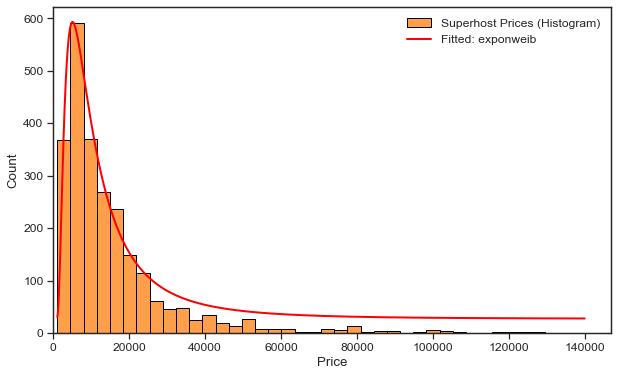

In [39]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_price, bins=40, ax=ax1,
             color='tab:orange', label='Superhost Prices (Histogram)')
ax1.set_xlabel('Price')
ax2 = ax1.twinx()
x = np.linspace(superhost_price.min(), superhost_price.max(), 1000)
fitted = exponweib.pdf(x, price_dist_superhost[2][0], price_dist_superhost[2][1],
                       price_dist_superhost[2][2], price_dist_superhost[2][3])
ax2.plot(x, fitted, 'r-', linewidth=2.0, label=f'Fitted: {price_dist_superhost[0]}')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.tick_params(right=False, labelright=False, top=False, labeltop=False)
plt.xlim(0,)
plt.show()

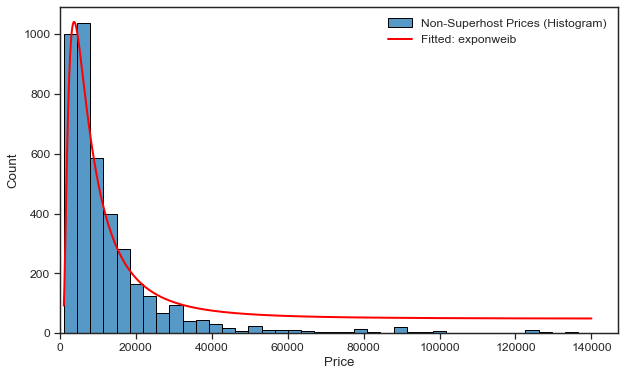

In [40]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_price, bins=40, ax=ax1,
             label='Non-Superhost Prices (Histogram)')
ax1.set_xlabel('Price')

ax2 = ax1.twinx()
x = np.linspace(nonsuperhost_price.min(), nonsuperhost_price.max(), 1000)
fitted = exponweib.pdf(x, price_dist_nonsuperhost[2][0], price_dist_nonsuperhost[2][1],
                       price_dist_nonsuperhost[2][2], price_dist_nonsuperhost[2][3])
ax2.plot(x, fitted, 'r-', linewidth=2.0, label=f'Fitted: {price_dist_nonsuperhost[0]}')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.tick_params(right=False, labelright=False, top=False, labeltop=False)
plt.xlim(0,)
plt.show()

***(Insert discussion)***

For overall rating scores of Superhosts and non-Superhosts, we apply the same analysis, again using the Komlogorov-Smirnov Goodness-of-Fit Test.

In [41]:
best_score_dist = get_best_distribution(superhost_scores['review_scores_rating'])

p value for gamma = 0.0
p value for expon = 0.0
p value for exponweib = 2.4103221105131837e-61
p value for weibull_min = 2.7180766456935214e-39
p value for weibull_max = 7.878757563683171e-131
p value for powerlaw = 5.67611092013089e-156

Best fitting distribution: weibull_min
Best p value: 2.7180766456935214e-39
Parameters for the best fit: (251178191.09238374, -30527231.815250218, 30527236.71891638)


In [42]:
best_price_dist = get_best_distribution(nonsuperhost_scores['review_scores_rating'])

p value for gamma = 6.899975313511211e-138
p value for expon = 0.0
p value for exponweib = 2.583816557601536e-168
p value for weibull_min = 1.0677279407492004e-94
p value for weibull_max = 2.3699563317641362e-91
p value for powerlaw = 2.3699563317244436e-91

Best fitting distribution: weibull_max
Best p value: 2.3699563317641362e-91
Parameters for the best fit: (0.9680741200826084, 5.000000000000001, 0.4107732857048751)


Considering the very-low p-values obtained, none of the distributions tested appear to be a good fit to the data on overall rating scores, for both Superhosts and non-Superhosts. Thus, in comparing the ratings distributions, it would be prudent to use a non-parametric test.

### **7.4 Tests Comparing Two Distributions (Mann-Whitney U Test)**

The Mann-Whitney U test is a non-parametric test used to compare differences between two independent groups when the dependent variable (`price` and `review_scores_rating`) is either ordinal or continuous, but not normally distributed. It is often used as a test of difference in location between distributions.

We shall test the following, at 95% confidence level ($\alpha$=0.05):  
<center>$H_0$: The distribution underlying $x$ is stochastically less than or equal to that of $y$</center>
<center>$H_1$: The distribution underlying $x$ is stochastically greater than that of $y$</center>

The variable $x$ will be assigned to the Superhost listings, and $y$ to Non-Superhost listings.

  <font size="3"><b>Table 4. Mann-Whitney U Test Results</b></font>

In [43]:
# Non-Parametric Hypothesis Testing of Price Distribution
# To test if price distribution of Superhost <= Non-Superhost
print("Mann-Whitney U Test p-value (price) =",
      mannwhitneyu(a, b, alternative='greater').pvalue)

# To test if OER distribution of Superhost <= Non-Superhost
print("Mann-Whitney U Test p-value (overall experience rating) =",
      mannwhitneyu(c, d, alternative='greater').pvalue)

Mann-Whitney U Test p-value (price) = 1.7145250634222524e-27
Mann-Whitney U Test p-value (overall experience rating) = 3.455169664020553e-199


Given that the resulting `p-values` after running the test to compare `price` and `review_scores_rating` between host types are less than $\alpha$, **there is sufficient evidence to reject the null hypotheses that prices and overall experience for Superhosts are less than or equal to those for non-Superhosts**.  Thus, we say the following, at the 95% confidence level:

* The prices of listings from Superhosts tend to be higher than those from Non-Superhosts.
* Super hosts tend to receive higher overall experience ratings than Non-Superhosts.

## **8.0 Resampling**

<b><i>
1. look at the sampling distribution for the average ratings. since we already proved it's not normally distributed, we can't use a typical t-dist confidence interval and use resampling instead
 
2. use an ML classifier to predict whether a listing is Superhost vs non-Superhost and then use resampling to get the sampling distribution of the accuracy
</b></i>

## Results and Discussion

* Cursory evaluation of EDA boxplots appears to suggest that Superhosts’ listings are occupied more frequently compared to Non-Superhosts.  Superhosts also seem to have been hosting longer than Non-Superhosts.
* The resulting hypothesis testing suggests that Superhost listings tend to be priced higher, and receive better overall reviews than the Non-Superhost counterparts. This shows that the hosts somehow meet the service level requirements of Airbnb.

***(discuss results)***

## Conclusion and Recommendations

This exploratory study on Tokyo's Airbnb listings revealed interesting insights into the similarities and differences of Superhost and Non-Superhost listings. While some were quite intuitive such as the moderate positive linear correlation of the `number_of_reviews` with `days_as_host`, as well as the strong positive correlation or `accommodates` to `beds` and `bedrooms` that are all apparent to both groups; some supported certain listings impressions such as the difference in Overall Experience Ratings and Price per host type, with Superhost listings coming up top. Being a hugely cosmopolitan city, listings all over Tokyo appear to not have particular price levels that anchor on location.

***(discuss conclusions)***

Although this study focuses on exploratory data analysis, it may be a good avenue to venture to further investigation of this data set by doing the following:

1. Do outlier analysis to better evaluate which methods to apply to this data set.
2. Explore other methods of scaling prior to applying dimensionality reduction techniques.
3. Perform cluster analysis and evaluate if characteristics of formed clusters would be better in segmenting the listings.
4. Further review the weak correlation of Superhosts maintaining a high Overall Experience Score versus the different review categories.
5. Consider applying machine learning to create classifier models on Superhost tagging and note which features best classify the listings' host status.
6. Create prediction models for price, to see if the features that stand out in this study, like `number of reviews`, capacity features (`accommodates`, `bedrooms`, `beds`, and `bathrooms`), and `amenities_ct` also influence price. 

## References

[1] "New Record for International Visitors to Japan", 2020, https://www.nippon.com/en/japan-data/h00631/new-record-for-international-visitors-to-japan.html    
[2] "What is a Superhost", https://www.airbnb.com/help/article/828/what-is-a-superhost  
[3] Airbnb, https://news.airbnb.com/about-us/  
[4] "Airbnb removes 80% of Japan home-share listings", 2018, https://asia.nikkei.com/Spotlight/Most-read-in2018/Airbnb-removes-80-of-Japan-home-share-listings  
[5] "Airbnb says it’s back in business in Japan", 2019, https://www.bworldonline.com/airbnb-says-its-back-in-business-in-japan/  
[6] Inside Aibnb, http://insideairbnb.com/about.html  
[7] Airbnb Star Ratings, https://www.airbnb.com/help/article/1257/star-ratings  
[8] "Making reviews more fair for hosts", 2019, https://www.airbnb.com/resources/hosting-homes/a/making-reviews-more-fair-for-hosts-93  
[9] Ratner, B. (2009, May), "The correlation coefficient: Its values range between +1/−1, or do they?", https://link.springer.com/article/10.1057/jt.2009.5  
[10] Scipy Stats Documentation, https://docs.scipy.org/doc/scipy/reference/stats.html

## Acknowledgements

Big thanks to:
* Prof. Christian Alis, for imparting to his students the fundamentals of Data Mining and Wrangling.
* Leo Lorenzo II, for always being available to his mentees for questions and consultations.
* Mike Dorosan, for providing guidance on the game plan for this study.
* Prof. Sebastian Ibanez, for guiding his students on the theory and application of computational statistics in data science, and for being very cool.

In [47]:
lr_select['price'].shape

(6616,)

<AxesSubplot:>

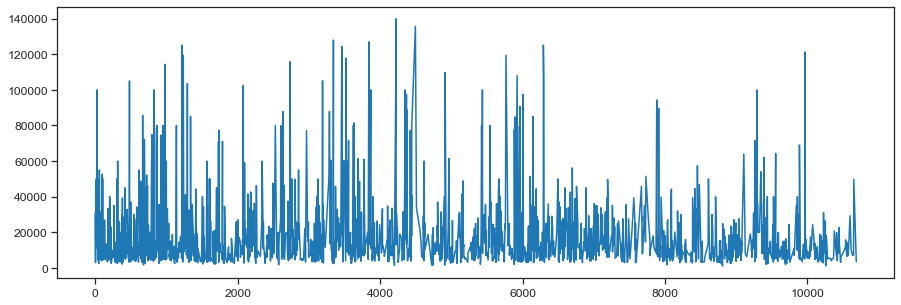

In [49]:
superhost_price.plot(figsize=(15, 5))

In [100]:
# ['review_scores_rating', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

design_mat = lr_select.copy()

room_type = pd.get_dummies(design_mat['room_type'])

design_mat = design_mat.drop(['name', 'host_id', 'host_name', 'property_type', 'room_type'], axis=1)
design_mat['host_is_superhost'] = design_mat['host_is_superhost'].map({"Superhost": 0, "Non-Superhost": 1})

design_mat = pd.concat([design_mat, room_type], axis=1)
design_mat


X = design_mat.drop('review_scores_rating', axis=1)
y = design_mat['review_scores_rating']
feature_names = X.columns

In [101]:
X

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,amenities_ct,days_as_host,bathrooms,hrr,Entire home/apt,Hotel room,Private room,Shared room
2,0,2.0,35.744370,139.797390,2,1.0,0.0,30000.0,1,90,270,72,4.78,4.61,4.84,4.84,4.34,4.62,0.80,30,3034,1.0,1.00,0,0,1,0
3,0,3.0,35.692330,139.708510,3,1.0,3.0,11312.0,1,1124,365,252,4.90,4.94,4.95,4.93,4.85,4.92,2.80,43,3012,1.0,1.00,0,0,1,0
4,0,2.0,35.744750,139.797310,2,1.0,2.0,3000.0,2,30,88,95,4.87,4.75,4.92,4.88,4.67,4.75,1.01,32,3034,1.0,1.00,0,0,1,0
5,0,1.0,35.651110,139.721650,3,1.0,1.0,32000.0,4,1125,335,102,4.97,4.98,4.96,4.89,4.98,4.91,1.54,50,2963,1.0,1.00,1,0,0,0
7,0,3.0,35.739870,139.851760,4,2.0,4.0,14857.0,4,30,327,339,4.94,4.97,4.96,4.96,4.73,4.88,3.86,31,2976,2.5,1.00,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10674,1,0.0,35.697010,139.708286,3,1.0,2.0,3571.0,1,365,98,1,4.00,5.00,4.00,4.00,5.00,5.00,1.00,30,29,1.0,1.00,1,0,0,0
10687,0,121.0,35.695170,139.733720,2,1.0,1.0,3407.0,1,1125,331,1,4.00,3.00,5.00,4.00,5.00,5.00,1.00,23,949,1.5,1.00,1,0,0,0
10703,1,0.0,35.563020,139.716622,6,1.0,3.0,4500.0,1,1125,59,1,5.00,5.00,5.00,5.00,5.00,5.00,1.00,22,63,1.0,1.00,1,0,0,0
10711,1,11.0,35.713962,139.792814,1,1.0,8.0,1500.0,1,365,258,2,4.00,3.00,4.00,4.50,4.50,5.00,2.00,11,1428,1.0,0.97,0,0,0,1


In [83]:
mms = MinMaxScaler()
X_scaled = pd.DataFrame(mms.fit_transform(X))
X_scaled.columns = X.columns
X_scaled.head()

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bedrooms,beds,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,amenities_ct,days_as_host,bathrooms,hrr,Entire home/apt,Hotel room,Private room,Shared room
0,0.0,0.015504,0.702404,0.854018,0.066667,0.000000,0.000000,0.000000,0.079181,0.739726,0.145492,0.8900,0.9450,0.9025,0.9600,0.9600,0.8350,0.9050,0.033305,0.432836,0.825419,0.041667,1.0,0.0,0.0,1.0,0.0
1,0.0,0.023256,0.522888,0.740393,0.133333,0.000000,0.053571,0.000000,0.999110,1.000000,0.514344,0.9750,0.9750,0.9850,0.9875,0.9825,0.9625,0.9800,0.118702,0.626866,0.819380,0.041667,1.0,0.0,0.0,1.0,0.0
2,0.0,0.015504,0.703715,0.853916,0.066667,0.000000,0.035714,0.016949,0.025801,0.241096,0.192623,0.9275,0.9675,0.9375,0.9800,0.9700,0.9175,0.9375,0.042272,0.462687,0.825419,0.041667,1.0,0.0,0.0,1.0,0.0
3,0.0,0.007752,0.380696,0.757191,0.133333,0.000000,0.017857,0.050847,1.000000,0.917808,0.206967,0.9900,0.9925,0.9950,0.9900,0.9725,0.9950,0.9775,0.064902,0.731343,0.805929,0.041667,1.0,1.0,0.0,0.0,0.0
4,0.0,0.023256,0.686881,0.923525,0.200000,0.034483,0.071429,0.050847,0.025801,0.895890,0.692623,0.9825,0.9850,0.9925,0.9900,0.9900,0.9325,0.9700,0.163962,0.447761,0.809498,0.104167,1.0,1.0,0.0,0.0,0.0


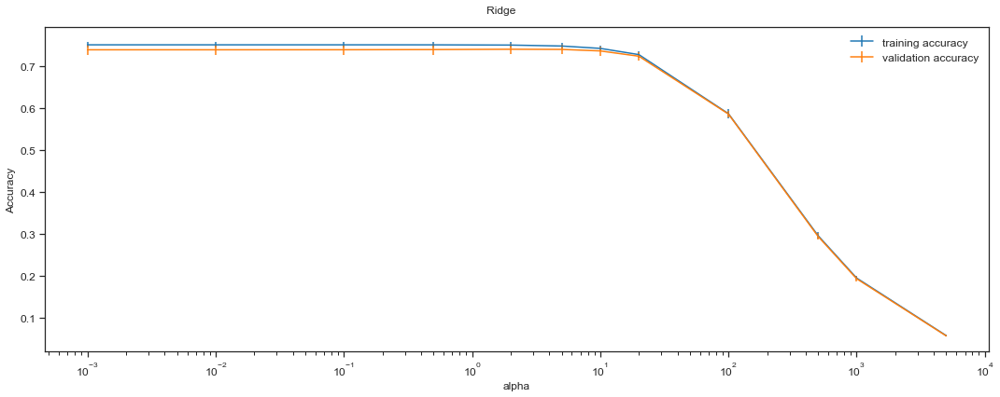

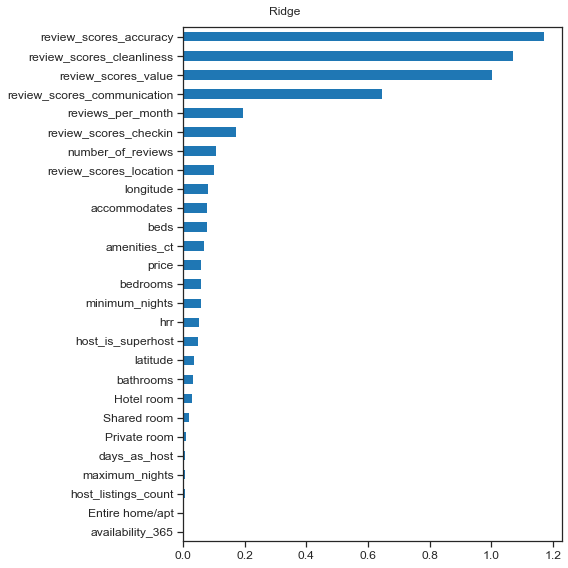

,model_top_parameter,mean_train_score,std_train_score,mean_test_score,std_test_score,top_predictor,run_time
0,'Ridge__alpha': 2,0.749962,0.00679,0.740016,0.012194,review_scores_accuracy,3.924521


In [102]:
def train_ridge():
    start_time = time.time()
    
    steps = [('scaler', MinMaxScaler()),
             ('Ridge', Ridge(random_state=1))]
    pipeline = Pipeline(steps)

    param_range = [1e-3, 1e-2, 0.1, 0.5, 2, 5, 10,  20, 100, 500, 1000, 5000]
    params = {'Ridge__alpha': param_range}
    model = list(params.keys())[0].split('__')[0]
    hyperparam = list(params.keys())[0].split('__')[1]

#     cv = RepeatedKFold(n_splits=15, n_repeats=30, random_state=1)
    cv = ShuffleSplit(n_splits=5, test_size=0.40)

    grid_search = GridSearchCV(pipeline, refit=True, param_grid=params,
                               cv=cv, return_train_score=True)
    grid_search.fit(X, y)

    results_df = pd.DataFrame(grid_search.cv_results_)
    results_df = (results_df[['params', 'rank_test_score',
                              'mean_train_score', 'std_train_score',
                              'mean_test_score', 'std_test_score']])

    fig = plt.figure(figsize=(15, 6))
    plt.errorbar(param_range, results_df['mean_train_score'],
                  yerr=results_df['std_train_score'], label="training accuracy")
    plt.errorbar(param_range, results_df['mean_test_score'],
                  yerr=results_df['std_test_score'], label="validation accuracy")
    plt.ylabel("Accuracy", fontsize=12)
    plt.xlabel(hyperparam, fontsize=12)
    plt.xscale('log')
    plt.suptitle(model)
    plt.legend()
    plt.tight_layout()
    plt.show()

    s_predictors = pd.Series(grid_search.best_estimator_.named_steps['Ridge'].coef_).abs()
    s_predictors.index = feature_names
    s_predictors = s_predictors.sort_values()

    fig, ax = plt.subplots(figsize=(8, 8))
    ax = s_predictors.plot(kind='barh')
    plt.suptitle(model)
    plt.tight_layout()
    plt.show()

    results_df = results_df.sort_values(by=['rank_test_score']).reset_index(drop=True)
    top_result = results_df[:1].copy()
    top_result['params'] = top_result['params'].astype(str).str.extract(r'{(.+)}')
    top_result = top_result.rename(columns={'params': 'model_top_parameter'})
    top_result = top_result.drop(['rank_test_score'], axis=1)
    top_result['top_predictor'] = s_predictors.nlargest().index[0]
    top_result['run_time'] = (time.time() - start_time)
    display(top_result)
    return top_result


ridge_results = train_ridge()

In [105]:
import mltools

ModuleNotFoundError: No module named 'mltools'